# Laboratorium 4 - Gotowe sieci w proszku

## _Jakub Szaredko_

## Weryfikacja dokładności modelu — wykrycie psa oraz kota na jednym obrazie

Do detekcji psa i kota wykorzystałem wytrenowany już model YOLO v11 o wielkości
Large (`yolo11l.pt`).

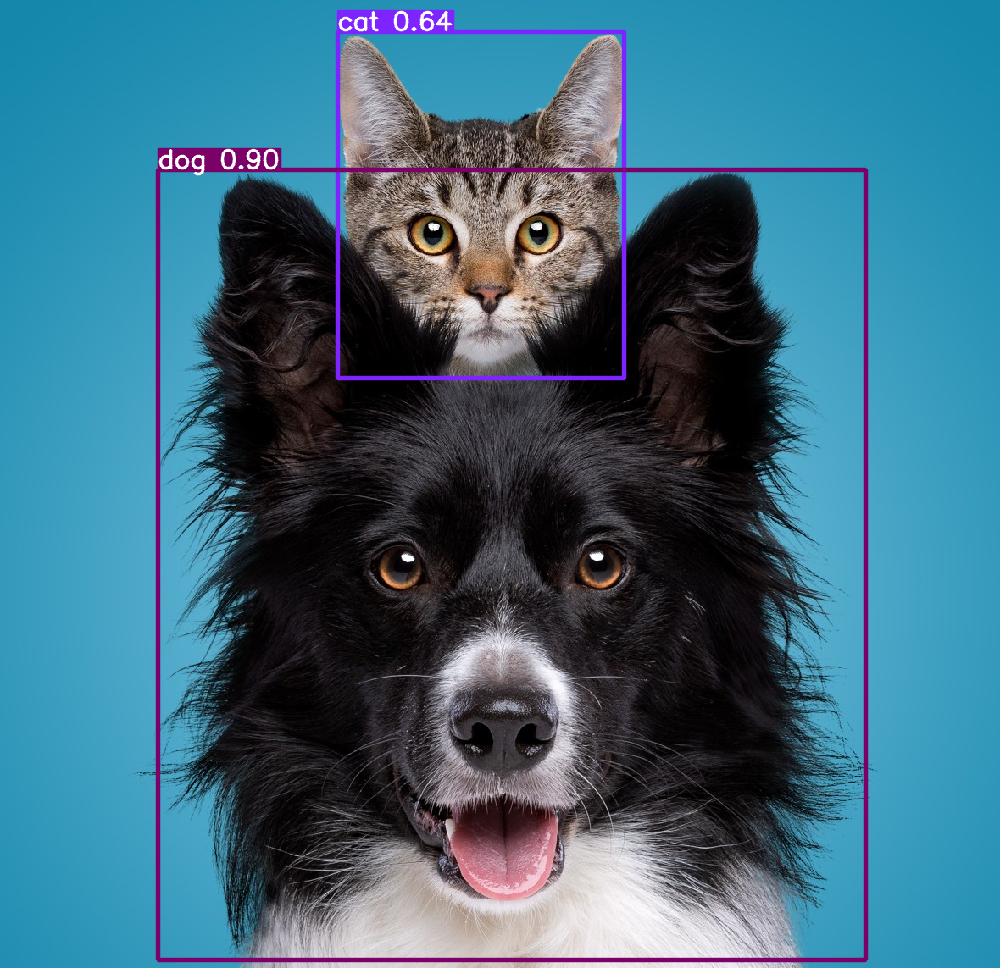

Jak widać detekcja zwierząt przebiegła pomyślnie i bardzo dokładnie. Można dojść
do wniosku, że kot ma nietypową urodę, bo jego pewność detekcji nie jest wysoka
😜

## Przygotowanie zbioru danych

Na początku pobrałem cztery niezbędne pliki:

- [downloader.py](https://raw.githubusercontent.com/openimages/dataset/master/downloader.py),
- [oidv7-class-descriptions-boxable.csv](https://storage.googleapis.com/openimages/v7/oidv7-class-descriptions-boxable.csv),
- [oidv6-train-annotations-bbox.csv](https://storage.googleapis.com/openimages/v6/oidv6-train-annotations-bbox.csv),
- [validation-annotations-bbox.csv](https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv).

Przeanalizowałem pliki CSV za pomocą DataFrame z Pandas, wyciągnąłem
interesującą nas w tym laboratorium etykietę ramek obiektów — Food, `/m/02wbm`.
Następnie wygenerowałem pliki tekstowe definiujące zbiory obrazów treningowych
i walidacyjnych, a także ich ramki. Na koniec dodałem plik YAML, który na celu
ma zdefiniowanie zbioru wykorzystanego do treningu. Poniżej znajdują się
fragmenty stworzonych plików.

- Zbiór obrazów treningowych.

  ```text
  train/a41d4dad91110202
  train/a19476731aa58013
  train/7dfe608f4213cba2
  train/0ac8f8959027b2aa
  train/93d4b73f04ee78cf
  ...
  ```

- Zbiór obrazów walidacyjnych.

  ```text
  validation/9663ea6c9b89709d
  validation/46500444b39f1d36
  validation/c6e49fcadad1bab5
  validation/0180e1bbb7a3bfa4
  validation/e1c622352f3a15ec
  ...
  ```

- Etykiety jednego z obrazów.

  ```text
  0 0.6091665 0.7396875 0.26666700000000004 0.12687499999999996
  0 0.2179165 0.44125000000000003 0.189167 0.10874999999999996
  0 0.44791650000000005 0.6284375 0.215833 0.073125
  0 0.434167 0.5471874999999999 0.12 0.030625000000000013
  0 0.5279165 0.58375 0.12083299999999997 0.04625000000000001
  ```

Finalnie pobrałem i wykorzystałem $2500$ obrazów treningowych i $500$
walidacyjnych, zostały one wybrane losowo.

Poniżej znajduje się większy fragment kodu, który wykorzystałem do przygotowania
zbioru danych.

In [ ]:
def generate_downloadable_image_file(
    image_ids: np.ndarray,
    mode: Literal["train", "validation"]
) -> None:
    with open(
        os.path.join(OID_PATH, f"{mode}-downloadable-images.txt"), "w"
    ) as f:
        for image_id in image_ids:
            f.write(f"{mode}/{image_id}\n")

In [ ]:
generate_downloadable_image_file(train_image_ids, "train")
generate_downloadable_image_file(val_image_ids, "validation")

In [ ]:
def oid_bbox_to_yolo(row: pd.Series) -> tuple[float, float, float, float]:
    x_min: float = row["XMin"]
    x_max: float = row["XMax"]
    y_min: float = row["YMin"]
    y_max: float = row["YMax"]

    width: float = x_max - x_min
    height: float = y_max - y_min

    center_x: float = (x_min + x_max) / 2
    center_y: float = (y_min + y_max) / 2

    return center_x, center_y, width, height


def generate_label_files(
    df: pd.DataFrame,
    mode: Literal["train", "validation"]
) -> None:
    base_path: LiteralString = os.path.join(
        OID_PATH, "labels", mode
    )
    os.makedirs(base_path, exist_ok=True)

    bbox_annotations: dict[str, list[tuple[float, float, float, float]]] = {}

    for _, row in df.iterrows():
        image_id = row["ImageID"]

        if image_id not in bbox_annotations:
            bbox_annotations[image_id] = []
        bbox_annotations[image_id].append(oid_bbox_to_yolo(row))

    for image_id, annotations in bbox_annotations.items():
        filepath: LiteralString = os.path.join(base_path, f"{image_id}.txt")
        with open(filepath, "w") as f:
            for annotation in annotations:
                f.write(f"0 {' '.join(map(str, annotation))}\n")

In [ ]:
generate_label_files(train_df, "train")
generate_label_files(val_df, "validation")

Główny plik definiujący dane dla YOLO wygenerowałem manualnie w Pythonie,
prezentuje się on następująco.

```yaml
path: /Volumes/ComputerScience/uni/sem7/image-recognition/lab4-detection/dataset/open-images-v7
train: images/train
val: images/validation

names:
    0: Food
```

In [ ]:
def generate_yolo_dataset_config() -> None:
    abspath: str = os.path.abspath(OID_PATH)
    filepath: str = os.path.join(abspath, "oidv7.yaml")

    with open(filepath, "w") as f:
        f.write(
            f"path: {abspath}\n"
            "train: images/train\n"
            "val: images/validation\n"
            "\n"
            "names:\n"
            "    0: Food\n"
        )

## Trening modelu

Trening przeprowadziłem wykorzystując najmnieszją wersję YOLO v11 o rozmiarze
Nano (`yolo11n.pt`). Liczbę epok ustaliłem na $10$. Niżej prezentują się
wartości funkcji kosztów oraz miary jakości modelu na przestrzeni całego
treningu ($10$-ciu epok).

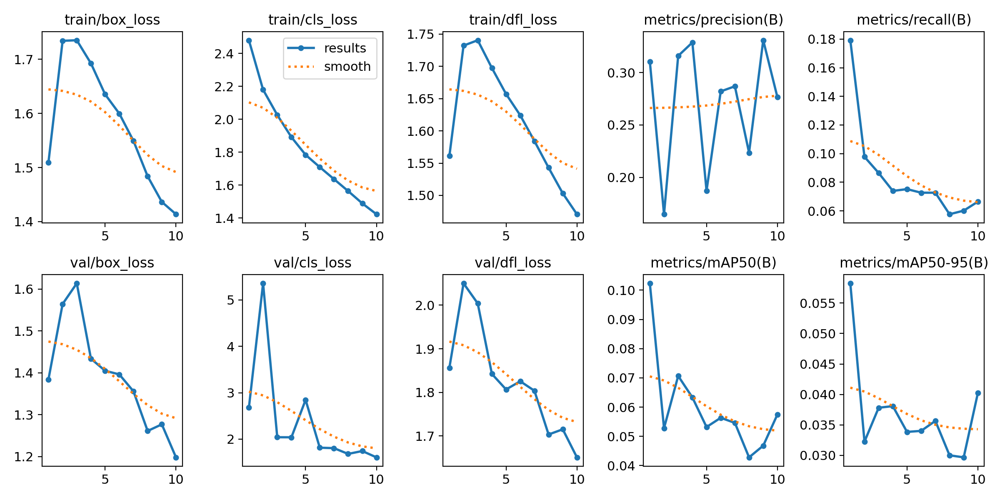

## Walidacja modelu

Do przeprowadzenia małej (ale to naprawdę małej) walidacji pobrałem 5 losowych
(pierwszych 😝) ze zbioru testowego Open Images V7.

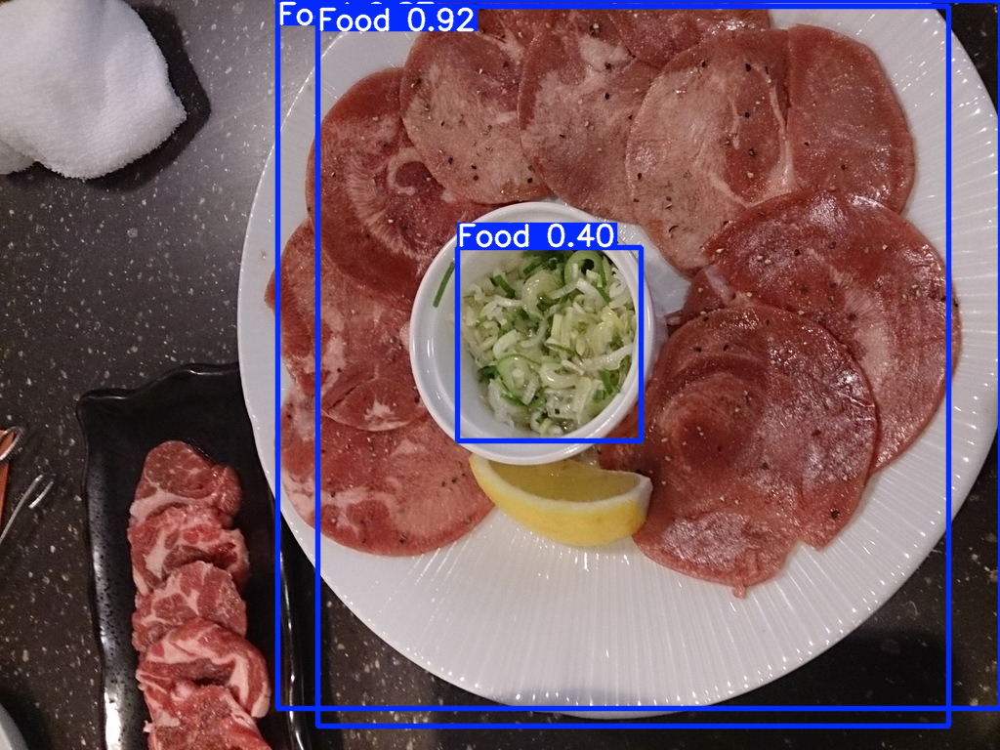
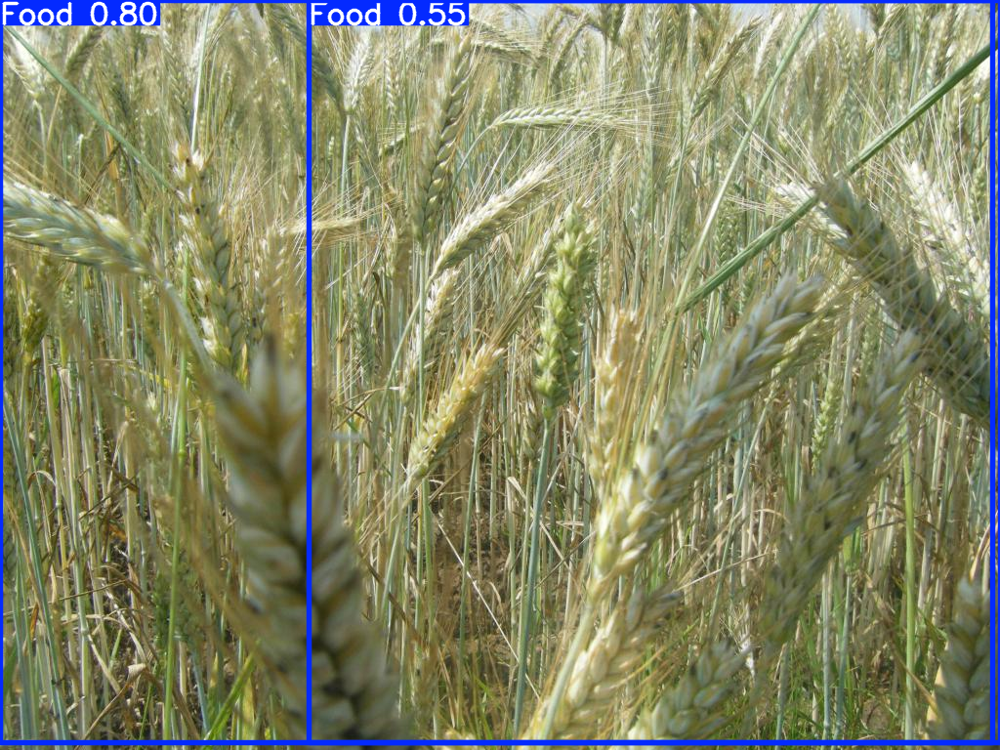
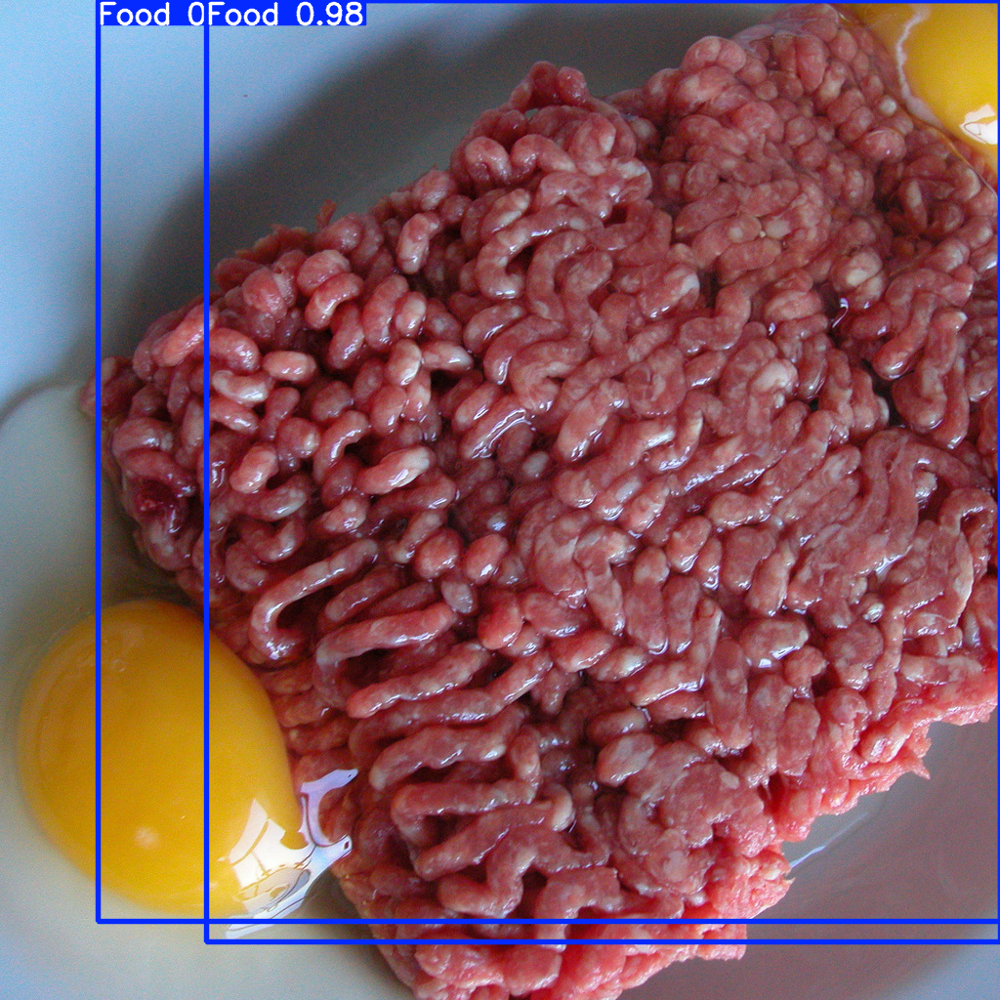
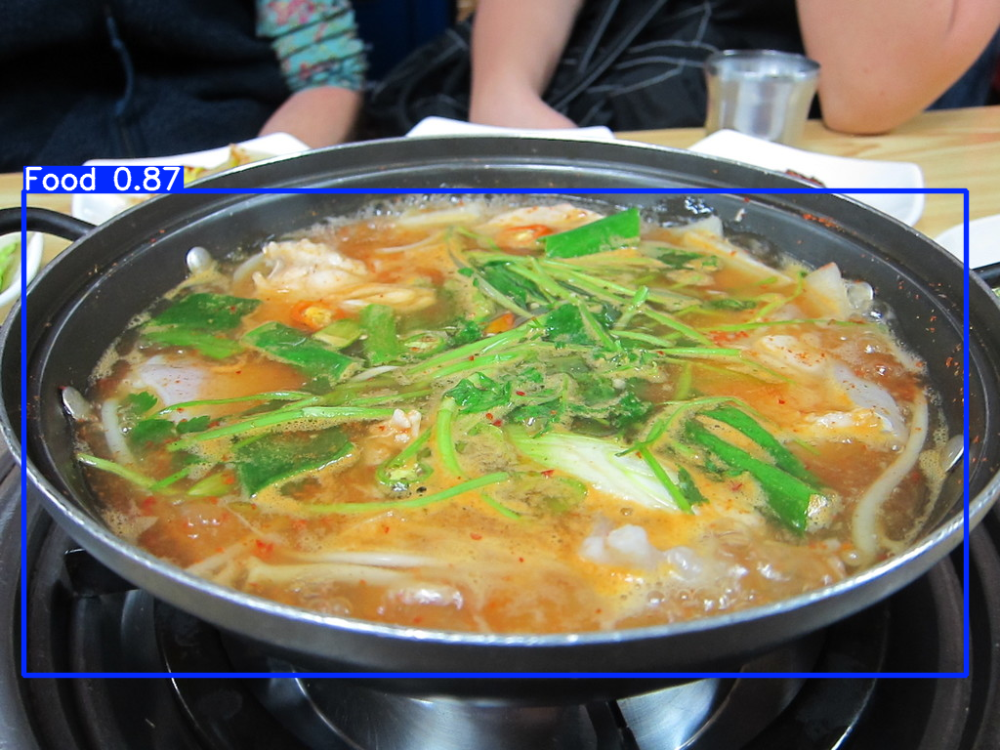
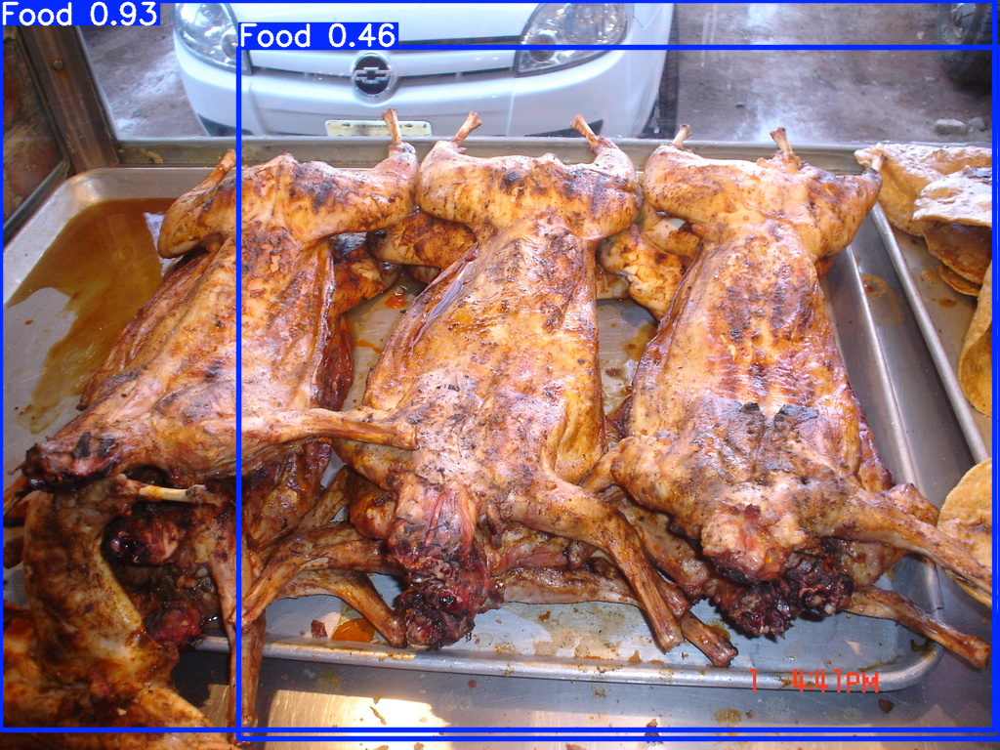

Można zaobserwować, że model sobie poradził dość przeciętnie na niektórych
obrazach, przede wszystkim tam gdzie żywność zawiera znaczną część przestrzeni.

Rozmycie obrazów uzyskałem za pomocą biblioteki `Pillow` i metody
`ImageFilter.GaussianBlur`. Poniżej znajdują się efekty jedynie słusznej
cenzury, śmierć obżartuchom!

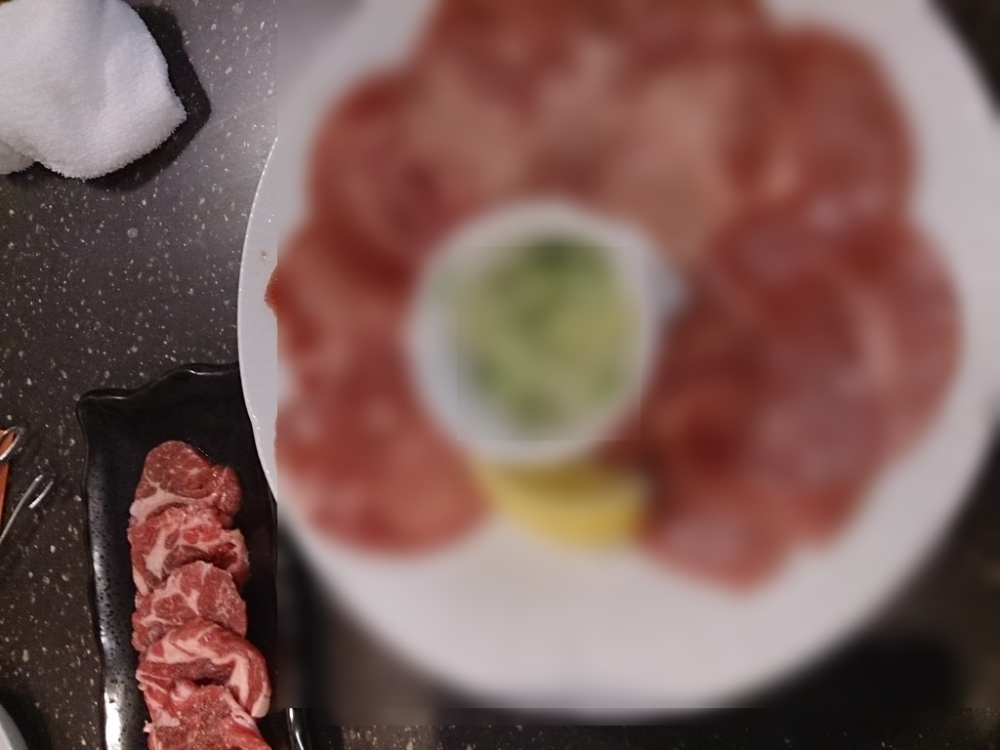
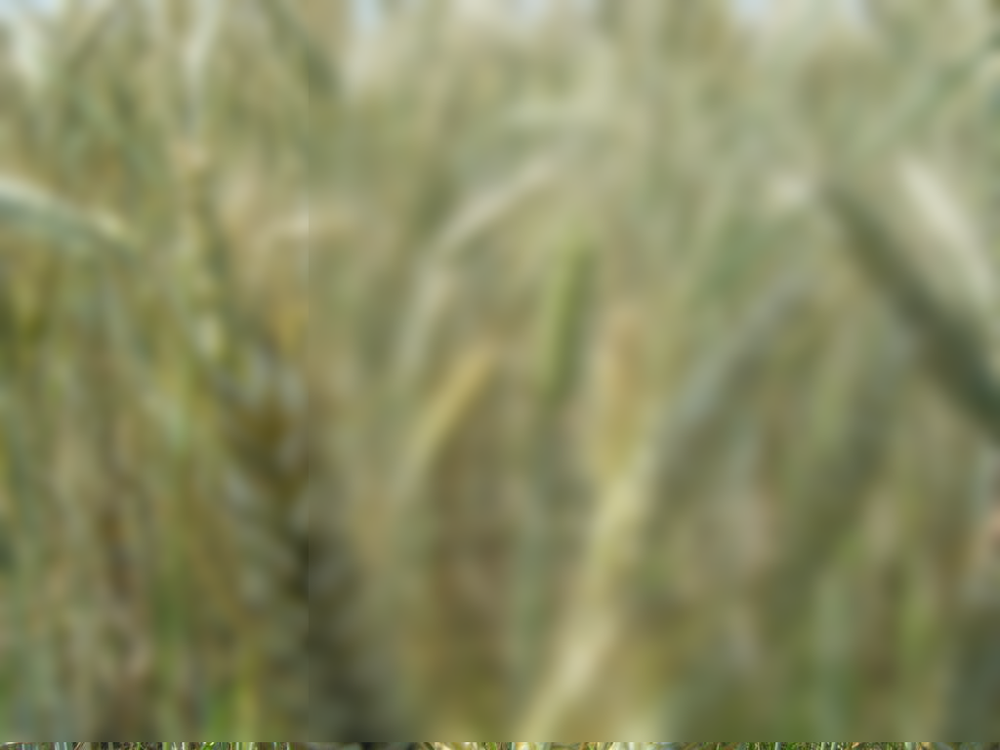
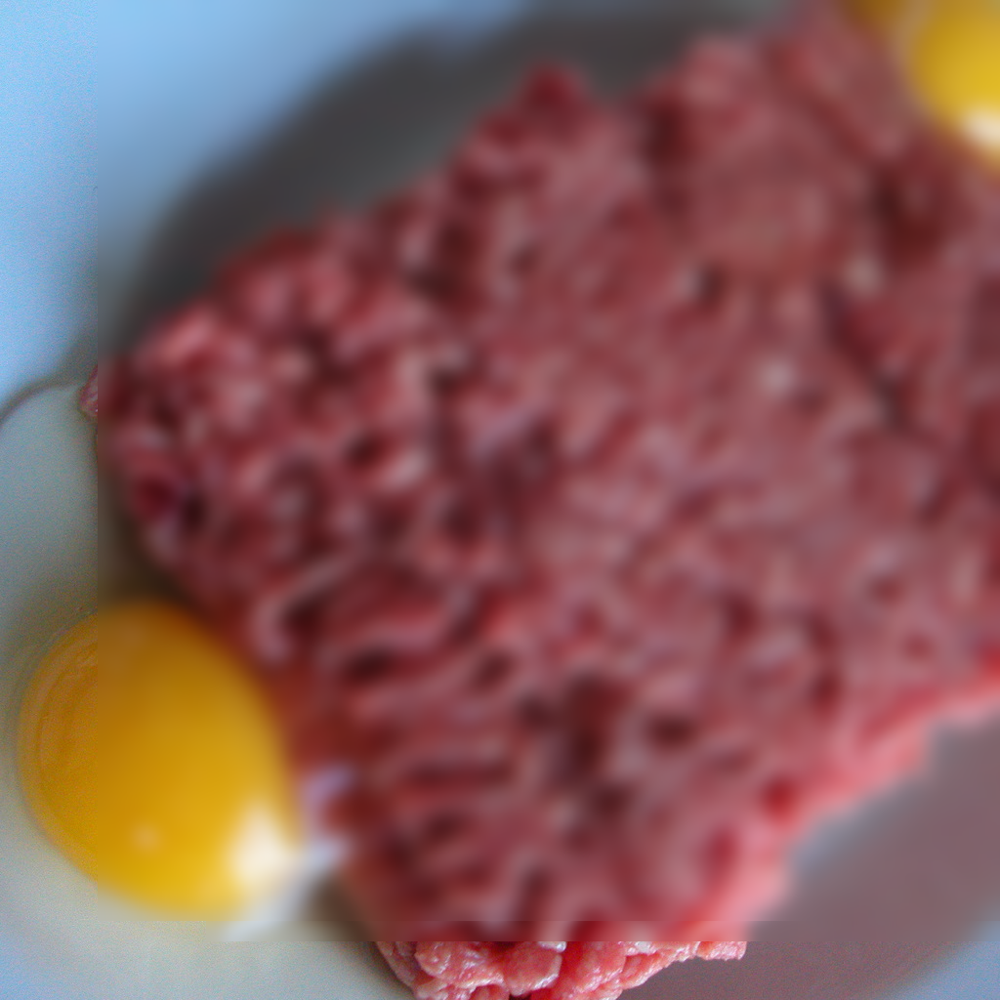
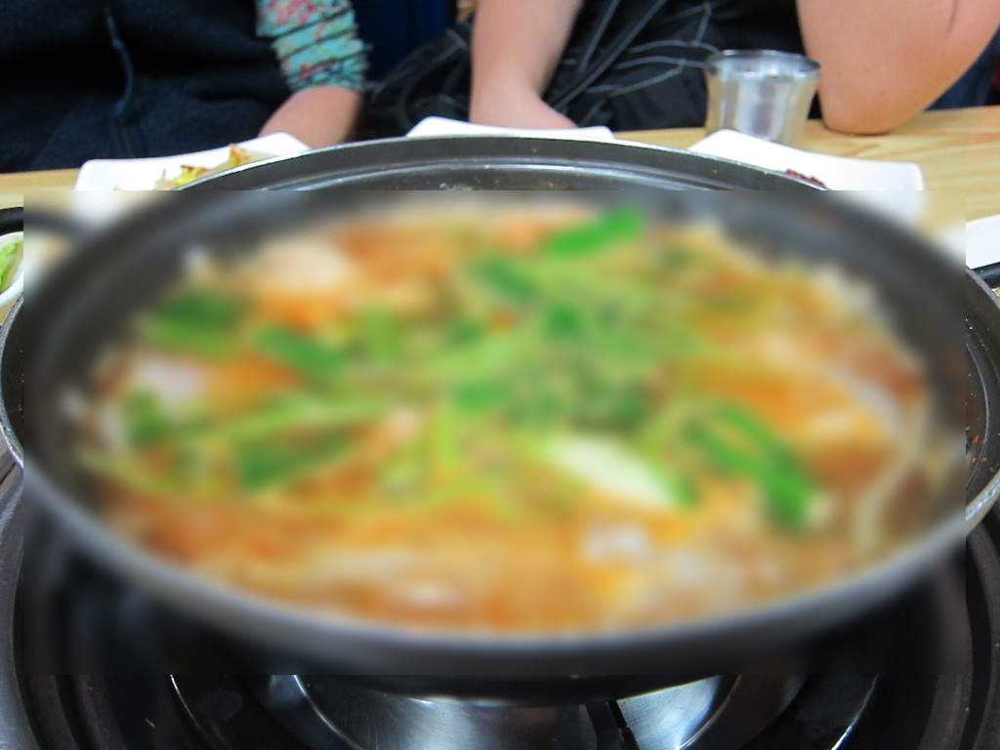
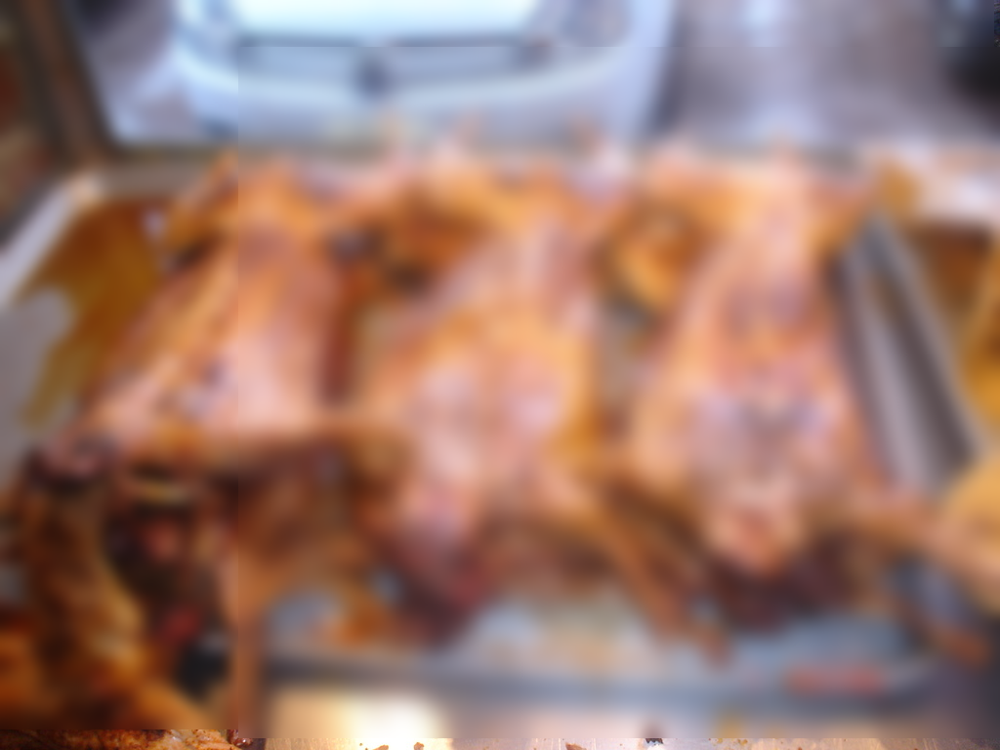

A na koniec do tej sekcji dodaję kod funkcji rozmycia obrazów.

In [ ]:
def blur_food(image: Image, results) -> Image:
    for coords in results.boxes.xyxy.long():
        x1, y1, x2, y2 = coords.tolist()
        food = image.crop((x1, y1, x2, y2))
        blurred_food = food.filter(ImageFilter.GaussianBlur(radius=8))
        image.paste(blurred_food, (x1, y1, x2, y2))

    return image

# Podsumowanie

To laboratorium było prostsze od poprzedniego. Największą trudnością jaką
napotkałem była przeciętna, momentami wręcz słaba dokumentacja dostarczona przez
Ultralytics _(no i może czas treningu, który wyniósł lekko ponad 3 godziny dla
10-ciu epok_ 🙈 _)_.